# Classifying Classical Music - Feature Extraction, SVM Analysis, Main Findings Walkthrough

## Music Classification Mini-Project

#### Data Analysis by Carl Merrigan, carl.merrigan@fulbrightmail.org

## Goal: 

### The goal of this project is to develop a classifier/pipeline that is able to determine which midi files in the provided PS2 folder are not written by the four (4) composers above (it is a small number)
 


## Problem Statement: 

* We would like to build an application identifying whether a short audio clip of *15 - 60 seconds* was written by one of four great classical music composers , or not by any of the four . 

* The four composers for the analysis will be **Bach, Beethoven, Brahms, and Schubert**

## Available Data and Data Structure

* The Data set provided by the client contains MIDI files with detailed annotations of the Scores of the musical pieces ranging between 2 - 6 minutes each. 

* **FILES** The data files contain structures describing in depth annotated instructions for replaying a piece of music

    * Detailed information about each measure of the piece, and parts for each instrument are available including note, time-signature, pitch, instrument
    
    * Some files contain MetaData giving composition name, Composer name, year written, etc... But this metadata can be missing our incomplete, and might not be available for the final application 
    
    * The MIDI files .mid (short for [Musical Instrument Digital Interface File](https://www.lifewire.com/midi-file-2621979#:~:text=A%20file%20with%20the%20.,therefore%20much%20smaller%20in%20size.) can be parsed using the Python Library [music21](https://web.mit.edu/music21/doc/about/what.html) available from [Authors](https://web.mit.edu/music21/doc/about/about.html) at MIT 
    
    * MIDI files have rich information, but are ideal for transmitting data because they are very compressed compared to other audio formats like .wav files or .mp3.    MIDI files are analogous to vectorized image reprsentation as opposed to numerical .png RGB representations of an image 
    
    * MIDI files can be rendered to jupyternote books: **LISTEN TO SOME EXAMLPES BY THE FOUR COMPOSERS**:   
    
    
    

In [1]:
from music21 import midi
from helper_functions import *

Composers = ['Bach','Beethoven','Brahms','Schubert']; midi_files = make_composer_dict(Composers,data_dir = './')

for composer in Composers:
    print(f'There are {len(midi_files[composer])} compositions by {composer}')
    
    audio_path = midi_files[composer][2]
    
    mf = midi.MidiFile()
    mf.open(audio_path) # path='abc.midi'
    mf.read()
    mf.close()

    s = midi.translate.midiFileToStream(mf)
    
    print(audio_path)

    s.show('midi')

There are 17 compositions by Bach
./Bach/Violin Sonata No 1 in G minor_BWV1001_2243_vs1_3.mid


There are 132 compositions by Beethoven
./Beethoven/Piano Sonata No 8 in C minor_OP13_2576_ps08_03.mid


There are 20 compositions by Brahms
./Brahms/Horn Trio in E-flat major_OP40_2158_bra40_1.mid


There are 25 compositions by Schubert
./Schubert/Piano Sonata in A minor_D784_1756_sy_sps53.mid


## Chosen Approach ---> Support Vector Machines

* A lightweight classical ML approach is the best option for a first attempt at an end-to-end extracting, processing, cleaning, feature building, classification, and predicting pipeline

    * Need a model that can generalize well from training on data sets of approximately 100 - 1000 samples 15, 30, or 60 sec audio clips 
    
    * Need a model that is light weight, yet flexible, so could be incorporated into online or mobile application with low overhead 
    
    * Also want fast data processing for real time streaming of data ----->  predictions 
    
    * The above requirments met by using [Support Vector Machines](https://en.wikipedia.org/wiki/Support_vector_machine) ---> this classical ML approach is good for finding Nonlinear decision boundaries between data points in features spaces , for data with small to intermediate number of features **n ~ 10 - 10,000** and small to intermediate number of samples **m ~ 100 - 10000** 
    
    * SVMs can be highly accurate , however there are two main considersations for optimization 
    
        * SVM hyperparameters such as nonlinear kernel choice, regularization parameter C, etc, need to be finely tuned
        
        * SVM improve with added DATA
        
    * **Advantage: COOL MUSIC FEATURES to LOOK AT** : Music21 library makes it easy to extract hundreds of music theoretic features from MIDI Files see by Cutherberrt [Music Feature Extraction](https://ismir2011.ismir.net/papers/PS3-6.pdf) and music21 documentation [features.jSymbolic](https://web.mit.edu/music21/doc/moduleReference/moduleFeaturesJSymbolic.html). Having these features is great because can later try to do in depth, domain relevant analysis of the musical differences between composers.  see the data exploration notebooks 

    
## Chosen Approach ---> SVM with Radial Bias Function Kernel trained on randomly sliced 15-second autio clips from the data set and on additionally sourced data

* I performed the SVM analysis both for 3 different training sets 

    1. 30-second clips, 15 tracks from each composer , 4 clips per track = m = 240 Training Examples 
    
    2. 15- second clips, 15 trakcs each composer, 8 each , m = 480 Training examples
    
    3. Augmented Data Set ---> Based on alalysis of [Learning Curves]() for the tuned SVM model, I found that that accuracy on cross validation sets is going up with increasing training set size. This implies the SVM model suggests that the  generalizing better 
    
* HYPERPARAMETER TUNING: 

    - SVMs depende on the chosen kernel , linear or nonlinear, and on the regularization tradeoff parameter C (like 1/lambda for usual regression) 
    
    - comparing different kernels, I was able to get best results for a RBF Radial Bias Function , which has a range parameter gamma which controls the stnadard deviation of the kernel esentially 
    
    - to optimize the model , I followed the Grid Search procedure outlined here
    
    - The great advantage of this approach is that picking the right Gamma and C can give great accuracy
    
Visualiation of the typical hyperparameter search 

![SVM Hyperparameter Tuning EXAMLPE](./images/sphx_glr_plot_rbf_parameters_002.png)

## Digression on Possible DEEP LEARNING Approach (For Future Development)

* **SKIP this section** if you want to read detailed DATA processing, Feature Selection, and Model tuning analysis

* Digression on  an alternative approach, which might work well , but would need more time to develop effectivelly. 

* A popular approach for classifiying audio data relies essentially on transforming time series data into "pictures" aka a [spectrogram](https://matplotlib.org/3.1.1/gallery/images_contours_and_fields/specgram_demo.html#sphx-glr-gallery-images-contours-and-fields-specgram-demo-py) [Spectrogram](https://en.wikipedia.org/wiki/Spectrogram) based on fast fourier transforms [FFT](https://en.wikipedia.org/wiki/Fast_Fourier_transform) of sliding window over the signal 

* This data pipeline would look like this [source](https://www.kaggle.com/code/christianlillelund/classify-mnist-audio-using-spectrograms-keras-cnn) : ![CNN_audio_class.png](./images/CNN_audio_class.png)

* This approach is prevelant and seemingly successful for audio classification problems 

* **HOWEVER** I did not develop this approach because : 

    - Not enough data ----> Neural Networks need huge data sets to train and generalize well , more like ~1000 - 10000 training samples but we only have ~ 100s of files available
    
    - Complex problem to decided on model architecture ---> standard architecture is several Conv + Pooling + Normalize, with decreasing image height width and increasing channels, then flatten and give to a softmax or to an RNN here are two references [CNN audio 1](https://hal.science/hal-01879276/document) , [CNN audio 2](https://medium.com/@zachcaceres/deep-learning-can-we-use-computer-vision-to-predict-the-composer-of-classical-music-464dd5516996)
    
    - Training could require large compute resources , GPUS, etc  not impossible , but not needed if a simpler Classical ML approach can get good performance
    
    

* See Notebook for outline of details of this approach (For future work): see notebook ---> "Convolutional NN Classifier "

* Here is an example of a spectrogram for one of the classical compisitions: 

./WAV_Files/Bach_Wav/Violin Partita No 3 in E major_BWV1006_2186_vs6_1.wav
2.2675745526612445e-05 44099 1323000 1291.9921875


/home/carlbrady/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_axes.py:7720: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


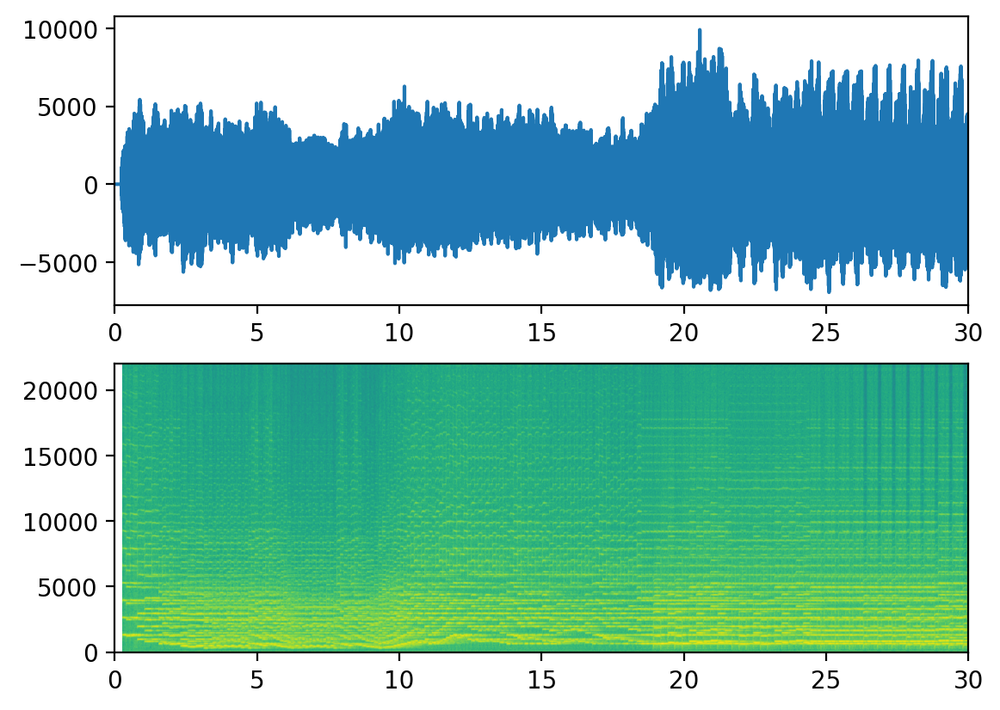

In [2]:
from helper_functions import *
from plotting_functions import *

from scipy.io import wavfile

import IPython

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

wav_files = make_composer_WAV_dict(Composers) ;WAV_file = wav_files['Bach'][1]; print(WAV_file)


seconds = 30

rate, data = wavfile.read(WAV_file)
plot_WAV_and_spectro(rate,data,seconds)

## HERE is what the above picture sounds like ! 

In [3]:
IPython.display.Audio(WAV_file)

# Analysis PIPELINE for SVM Classification 


* **STEP 1** Reading MIDI files into Memory  


* **STEP 2** Extracting musical score annotated information in form of stream objects 


* **STEP 3** Feature Extraction Based on Initial Data Exploration (see below) 


* **STEP 4** SVM Predictions based on BEST MODEL optimized for performance


* **STEP 5** Prediction of Composer = Bach, Beethhoven, Brahms, Schubert or *Unkown Composer*

# Predictions on Provided TEST Set

In [4]:
from pipeline_functions import *

TEST_DATA_DIR = './Part1(PS2)/'

test_files_list= get_audio_files(TEST_DATA_DIR)

audio_path = test_files_list[0]

mf = midi.MidiFile()
mf.open(audio_path) # path='abc.midi'
mf.read()
mf.close()

s = midi.translate.midiFileToStream(mf)

print(audio_path)

s.show('midi')

./Part1(PS2)/0.26551079719260606_adj.mid


/home/carlbrady/miniconda3/lib/python3.10/site-packages/music21/midi/translate.py:2314: TranslateWarning: StringInstrument specified 1-indexed MIDI channel 5 but acceptable channels were [2, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16]. Defaulting to channel 1.
  warnings.warn(


In [5]:
## I Found 1 test file that seemed to have corrupted MIDI data ... leaving it out for now

problem_files = []
problem_files.append(test_files_list.pop(test_files_list.index('./Part1(PS2)/0.539512676743813_adj.mid')))
problem_files

['./Part1(PS2)/0.539512676743813_adj.mid']

### NOTE! I didn't find a precise way to get exactly 15 second clips from the files

* the time info contained inside the stream objects is cryptic, hard to interpret for non musical theory experts..  I found some seconds prorties, but these seem to only correlate losely with the rendered length of the clip 

* Audio rendering . Another problem I encounted was completely different sound between stream object renderings of the audio vs Wave files. For the given data, music21 only renders 1 of mulitple instrument parts when rendering the audio samples to list to 

* I check an I am confident the audio issue is just for rendering , possibily due to software setup on my machine , and not effecting the feature extraction step of the data pipeline

In [6]:
# Using 15 second clips 

test_clips = extract_samples(test_files_list,T=15)

./Part1(PS2)/0.26551079719260606_adj.mid
clip:  0  -->  t =  15.189746300211416 start =  49 stop = 61  delta =  12
./Part1(PS2)/0.3264565808984162_adj.mid
clip:  0  -->  t =  16.30034969179706 start =  35 stop = 43  delta =  8
./Part1(PS2)/0.905499891236923_adj.mid
clip:  0  -->  t =  16.0 start =  14 stop = 21  delta =  7
./Part1(PS2)/0.33695573887576447_adj.mid
clip:  0  -->  t =  15.298314185814185 start =  22 stop = 38  delta =  16
./Part1(PS2)/0.3620067189216978_adj.mid
clip:  0  -->  t =  25.01145810495364 start =  4 stop = 9  delta =  5
./Part1(PS2)/0.48367685897240176_adj.mid
clip:  0  -->  t =  18.0 start =  11 stop = 16  delta =  5
./Part1(PS2)/0.7491289879531658_adj.mid
clip:  0  -->  t =  16.0 start =  27 stop = 42  delta =  15
./Part1(PS2)/0.06402123326764841_adj.mid
clip:  0  -->  t =  16.5 start =  84 stop = 94  delta =  10
./Part1(PS2)/0.21901852969811753_adj.mid
clip:  0  -->  t =  17.129374337221634 start =  40 stop = 46  delta =  6
./Part1(PS2)/0.3334293069825759_adj

### FINAL Features List: The following list of features seemed best after preliminary data exploration on the 15 second and 30 second data set

* Note : Many 100s features available in the music21 library, but extracting each one causes data processing to be slow 

* each data set took between 20 - 45 minutes to extract with my current code, could be improved, but this is the slowest bottleneck in the pipeline

In [7]:
best_features_list=['Range',
 'PitchVariety',
 'NumberOfCommonPitches',
 'NoteDensity',
 'AmountOfArpeggiation',
 'IntervalBetweenStrongestPitches',
 'MostCommonPitchClassPrevalence',
 'MostCommonPitchPrevalence',
 'RelativeStrengthOfTopPitchClasses',
 'RepeatedNotes',
 'MelodicOctaves',
 'SizeOfMelodicArcs',
 'VariabilityOfNoteDuration',
 'MelodicTritones',
 'PitchClassVariety']

In [8]:
clip_id_codes , X_PS2_TEST = extract_data(test_clips,best_features_list)

Beginning Feature Extraction for 34 clips
extracting clip 1/34...
extracting clip 2/34...
extracting clip 3/34...
extracting clip 4/34...
extracting clip 5/34...
extracting clip 6/34...
extracting clip 7/34...
extracting clip 8/34...
extracting clip 9/34...
extracting clip 10/34...
extracting clip 11/34...
extracting clip 12/34...
extracting clip 13/34...
extracting clip 14/34...
extracting clip 15/34...
extracting clip 16/34...
extracting clip 17/34...
extracting clip 18/34...
extracting clip 19/34...
extracting clip 20/34...
extracting clip 21/34...
extracting clip 22/34...
extracting clip 23/34...
extracting clip 24/34...
extracting clip 25/34...
extracting clip 26/34...
extracting clip 27/34...
extracting clip 28/34...
extracting clip 29/34...
extracting clip 30/34...
extracting clip 31/34...
extracting clip 32/34...
extracting clip 33/34...
extracting clip 34/34...


In [9]:
X_PS2_TEST.shape

(34, 15)

In [10]:
import pickle

filename = "./Saved_Models/RBF_SVM_C_1000_Gamma_02.pickle"

# save model
#pickle.dump(rbf_BEST_FINAL_MODEL, open(filename, "wb"))

# load model
loaded_model = pickle.load(open(filename, "rb"))

In [11]:
import pandas as pd

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_PS2_TEST = scaler.fit_transform(X_PS2_TEST)

TEST_PROBS_DF = pd.DataFrame(loaded_model.predict_proba(X_PS2_TEST),columns=['Bach','Beethoven','Brahms','Schubert'])

<AxesSubplot: >

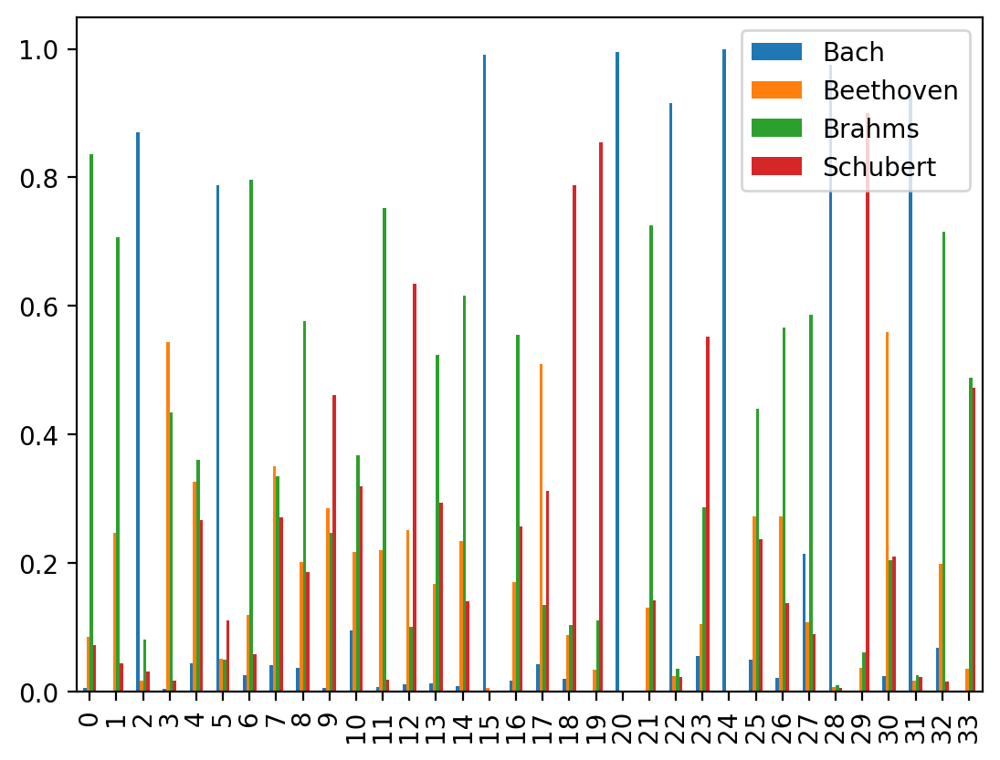

In [13]:
TEST_PROBS_DF.iloc[:,:].plot.bar()

# see that tallest bars here are blue and green, indicating most confidence for BACH and BRAHMS

In [14]:
max_prob_values = TEST_PROBS_DF.max(axis=1)

predictions = TEST_PROBS_DF.idxmax(axis=1)

Predictions_DF = pd.concat([pd.Series(clip_id_codes),predictions,predictions,max_prob_values],axis=1)

Predictions_DF.columns = ['Recording ID','Prediction','Prediction Final','SVM Prob']

confidence_threshold = 0.5  ## If the predicted composer has less than 0.5 probability, will predict NONE

Predictions_DF['Prediction Final'][Predictions_DF['SVM Prob']<0.5]='UNKNOWN COMPOSER'

/tmp/ipykernel_2554/2041558686.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Predictions_DF['Prediction Final'][Predictions_DF['SVM Prob']<0.5]='UNKNOWN COMPOSER'


# FINAL PREDICTIONS !

In [15]:
Predictions_DF.to_csv('./my_predictions_on_testset_PS2_34_tracks.csv')  

Predictions_DF.groupby('Prediction Final')['SVM Prob'].describe()

,count,mean,std,min,25%,50%,75%,max
Prediction Final,,,,,,,,
Bach,8.0,0.933458,0.074109,0.788457,0.904613,0.954100,0.991995,0.998882
Beethoven,3.0,0.537627,0.025938,0.509223,0.526412,0.543602,0.551829,0.560056
Brahms,12.0,0.663057,0.104429,0.524358,0.573806,0.661193,0.732330,0.835726
Schubert,5.0,0.745936,0.147539,0.552078,0.635232,0.787929,0.854861,0.899578
UNKNOWN COMPOSER,6.0,0.411616,0.058826,0.351351,0.362872,0.403611,0.455582,0.488926


## Confidence

* Best model predicts that there are 6 files by an UNKOWN composer 

* Can see that the modelprobabilities are highest for BACH   , from the data analyis I found that BACH features always fall in distinct ranges compared to other three composers

* Brahms is the next easiest to distinguish, as also seen from the bar plot of probability predictions above , tallest bars are blue and green

# Feature Selection - Data Exploration Summary : 


* I selected top features for each data set by finding the correlation of each feature with the composer label 

* strongest correlations were ~0.7 , with strongest correlations to a composer showing up for BACH

* selected top correlation based on a correlation threshold of 15 seconds

* also dropped some features that took long time to extract in interests of speeding up data extraction pipeline 

![correlation with features](./images/feature_composer_correlations.png)

![more correlation examples](./images/feature_composer_correlations2.png)

![Box plot of each feature for each composer](./images/feature_box_plots.png)

* can clearly see that BACH features fall in distinct ranges, whereas other composers the differences are more subtle

## Effect of Audio Clip Duration ???

* Would expect short clips to be harder to identify, since they have less info

* from bar plot of avg feature correlation with composer, see that the major become a little more weakly correlated for 15 second clips

* tradeoff might be worth it though, since can slice many more short clips from data set and get larger training data set, which seems to be good for the SVM , see below 


### comparing 15 vs 30 second data sets 

![correlation with features](./images/15_vs_30_barplot.png)

# Support Vector Machine - Extended Data Set

- Looking at the Learning curves for SVM on 240 30 seconds and 480 15 second clips , looked like cv accuracy was going up with data set size, suggests more DATA will help the model to generalize better

- DATA SOURCE : KAGGLE [MusicNet Midi FILES](https://www.kaggle.com/datasets/rohitsingh0210/musicnet-midi-files?select=musicnet_midis)

In [16]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import svm, datasets

import seaborn as sns

%matplotlib inline

In [17]:
data_dir = './DataStreamFeatures/DataFrames/'

df_best_features = pd.read_csv(data_dir + 'BestMusicFeatures_15seconds_MusicNet_Kaggle_313.csv')

data_dir = './DataStreamFeatures/DataFrames/'

df_best_features = pd.concat([pd.read_csv(data_dir + 'BestMusicFeatures_15seconds.csv'),df_best_features])

X = df_best_features.drop(['Composer_name', 'Composer_label'], axis=1)

training_features_list = list(X.columns)

X = X.to_numpy()

m, n = X.shape

print(f'{m} samples with {n} features each',type(X))

y = df_best_features['Composer_label'].to_numpy()

y.shape

793 samples with 15 features each <class 'numpy.ndarray'>


(793,)

In [18]:
X = df_best_features.drop(['Composer_name', 'Composer_label'], axis=1)

training_features_list = list(X.columns)

X = X.to_numpy()

m, n = X.shape

print(f'{m} samples with {n} features each',type(X))

print(X.shape)

X = X[:,:2]  # CAREFUL TO CHANGE THIS BACK LOWER DOWN ! 

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.85, random_state = 0)

# Scaling the Train and Test feature set 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_scaled = scaler.transform(X)

print(X.shape)

793 samples with 15 features each <class 'numpy.ndarray'>
(793, 15)
(793, 2)


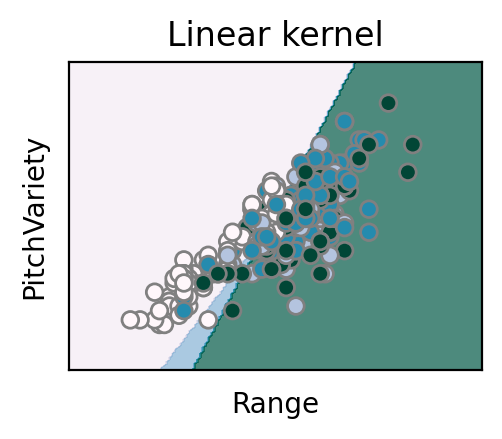

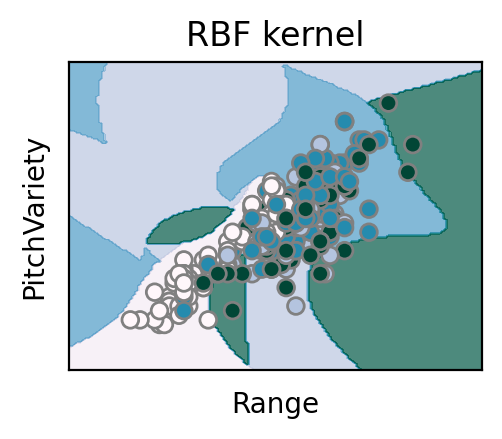

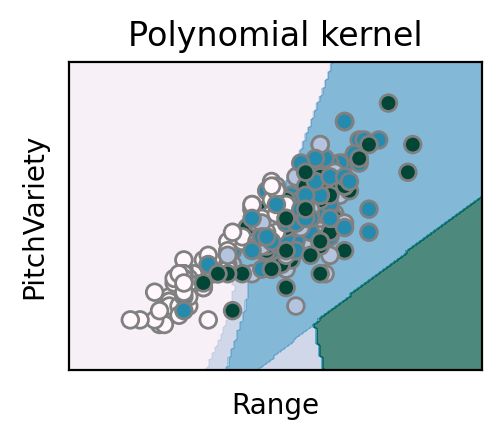

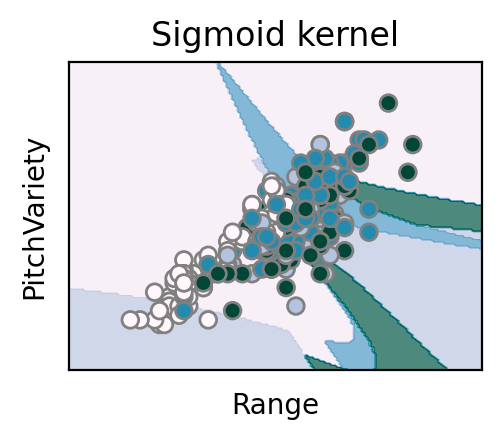

In [19]:
linear = svm.SVC(kernel='linear', C=1000, decision_function_shape='ovo').fit(X_train, y_train)
rbf = svm.SVC(kernel='rbf', gamma=0.1, C=1000, decision_function_shape='ovo').fit(X_train, y_train)
poly = svm.SVC(kernel='poly', degree=3, C=1000, decision_function_shape='ovo').fit(X_train, y_train)
sig = svm.SVC(kernel='sigmoid', C=1000, decision_function_shape='ovo').fit(X_train, y_train)

#stepsize in the mesh, it alters the accuracy of the plotprint
#to better understand it, just play with the value, change it and print it
h = .05
#create the mesh
x_min, x_max = X_scaled[:, 0].min() - 1, X_scaled[:, 0].max() + 1
y_min, y_max = X_scaled[:, 1].min() - 1, X_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h))
# create the title that will be shown on the plot
titles = ['Linear kernel','RBF kernel','Polynomial kernel','Sigmoid kernel']

for i, clf in enumerate((linear, rbf, poly, sig)):
    #defines how many plots: 2 rows, 2columns=> leading to 4 plots
    plt.subplot(2, 2, i + 1) #i+1 is the index
    #space between plots
    plt.subplots_adjust(wspace=0.4, hspace=0.4) 
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.PuBuGn, alpha=0.7)
    # Plot also the training points
    plt.scatter(X_scaled[::3, 0], X_scaled[::3, 1], c=y[::3], cmap=plt.cm.PuBuGn,     edgecolors='grey')
    plt.xlabel(training_features_list[0])
    plt.ylabel(training_features_list[1])
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xticks(())
    plt.yticks(())
    plt.title(titles[i])
    plt.show()

In [20]:
# retrieve the accuracy and print it for all 4 kernel functions
accuracy_lin = linear.score(X_test, y_test)
accuracy_poly = poly.score(X_test, y_test)
accuracy_rbf = rbf.score(X_test, y_test)
accuracy_sig = sig.score(X_test, y_test)
print('Accuracy Linear Kernel:', accuracy_lin)
print('Accuracy Polynomial Kernel:', accuracy_poly)
print('Accuracy Radial Basis Kernel:', accuracy_rbf)
print('Accuracy Sigmoid Kernel:', accuracy_sig)

Accuracy Linear Kernel: 0.42016806722689076
Accuracy Polynomial Kernel: 0.3949579831932773
Accuracy Radial Basis Kernel: 0.5126050420168067
Accuracy Sigmoid Kernel: 0.36134453781512604


# SVM Grid Search Results 

* from grid search of C, gamma space, clearly see that tuning gamma is most import 

* C doesn't have as much of an effect , unless gamma is small

![correlation with features](./images/SVM_grid_search_results.png)


In [21]:
Best_GAMMA = 0.2 
Best_C = 1000

In [22]:
X = df_best_features.drop(['Composer_name', 'Composer_label'], axis=1)

training_features_list = list(X.columns)

X = X.to_numpy()

m, n = X.shape

print(f'{m} samples with {n} features each',type(X))

print(X.shape)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.85, random_state = 0)

# Scaling the Train and Test feature set 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_scaled = scaler.transform(X)

print(X.shape)

793 samples with 15 features each <class 'numpy.ndarray'>
(793, 15)
(793, 15)


# Learning Curves 

I first did learning curves on 15 second data set and saw that cross validation accuracy was going up

1.0 train accuracy is usual behavior for SVM with nonlinear kernel see [source](https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html#sphx-glr-auto-examples-model-selection-plot-learning-curve-py)

![correlation with features](./images/learning_curve_15secData.png)

Similar results for larger data set, almost twice the data after adding Additional MusicNet kaggle data

![correlation with features](./images/learning_curve_larger_dataset.png)

In [24]:
from sklearn.model_selection import learning_curve
from sklearn.model_selection import RepeatedStratifiedKFold

svm_best_params = svm.SVC(kernel='rbf', gamma=Best_GAMMA, C=Best_C, decision_function_shape='ovo')

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)

scaler = StandardScaler()

X = scaler.fit_transform(X)


train_size_abs, train_scores, test_scores = learning_curve(
                                                            svm_best_params, X, y, cv=cv,train_sizes=np.linspace(0.3,1,20)
)


size_list = []

cv_train_list = []

cv_test_list = []

for train_size, cv_train_scores, cv_test_scores in zip(
    train_size_abs, train_scores, test_scores
):
    size_list.append(train_size)
    cv_train_list.append(cv_train_scores.mean())
    cv_test_list.append(cv_test_scores.mean())
    
    
    print(f"{train_size} samples were used to train the model")
    print(f"The average train accuracy is {cv_train_scores.mean():.5f}")
    print(f"The average test accuracy is {cv_test_scores.mean():.5f}")

190 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.45272
213 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.48828
236 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.52358
260 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.55232
283 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.56216
306 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.56769
330 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.59190
353 samples were used to train the model
The average train accuracy is 1.00000
The average test accuracy is 0.60451
377 samples were used to train the model
The average train accuracy is 1

<AxesSubplot: >

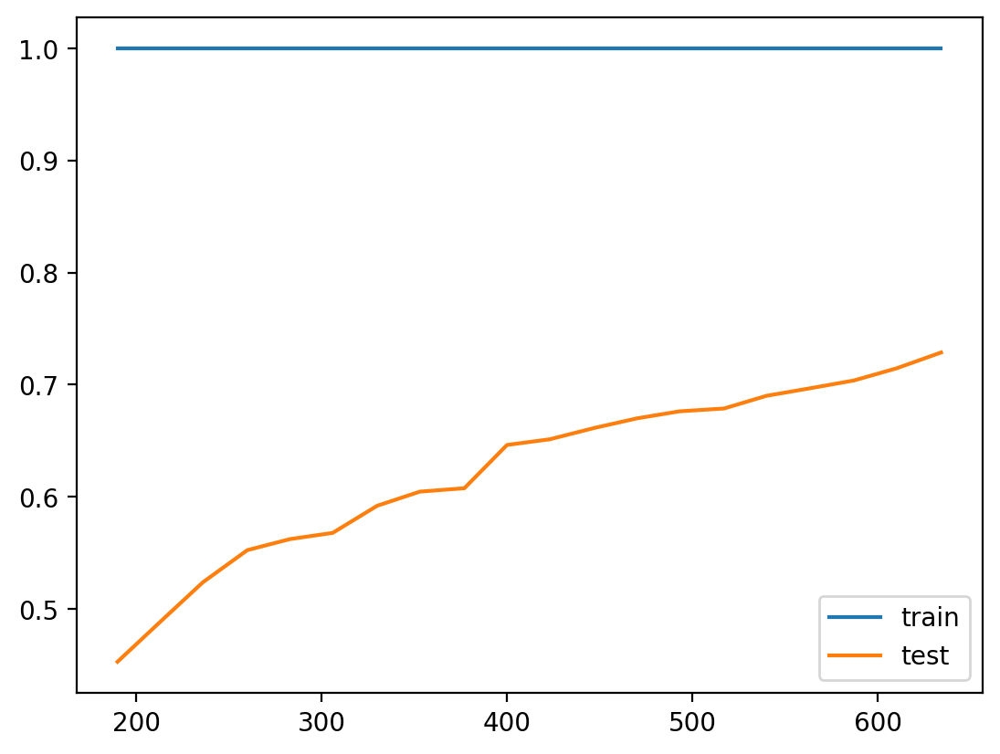

In [25]:
learing_results_df = pd.DataFrame([])

learning_df = pd.DataFrame(list(zip(cv_train_list, cv_test_list)),
               columns =['train','test'],index=size_list)

learning_df.plot()

# FINAL MODEL CHOICE 

* I seletled on the following model , based on augmented large data set of 15 second clips , evenly distributed ovall all four comoposers

* the model is optimized for hyperparamters C and V based on cross-validation grid search 

* The fact that the accuracy is increasing with training set size suggests the model is overfitting, and that the additional data helps it to generalize

* My intuition about overfitting vs underfitting for SVM not very good, though,   C should be a kind of regularization parameter, but it seems very insenstive to C, which seems to suggest amount of regulartization is not that important , which suggests underfitting 

In [27]:
import pickle

filename = "./Saved_Models/RBF_SVM_C_1000_Gamma_02.pickle"

# load model
my_Final_Model = pickle.load(open(filename, "rb"))

<AxesSubplot: >

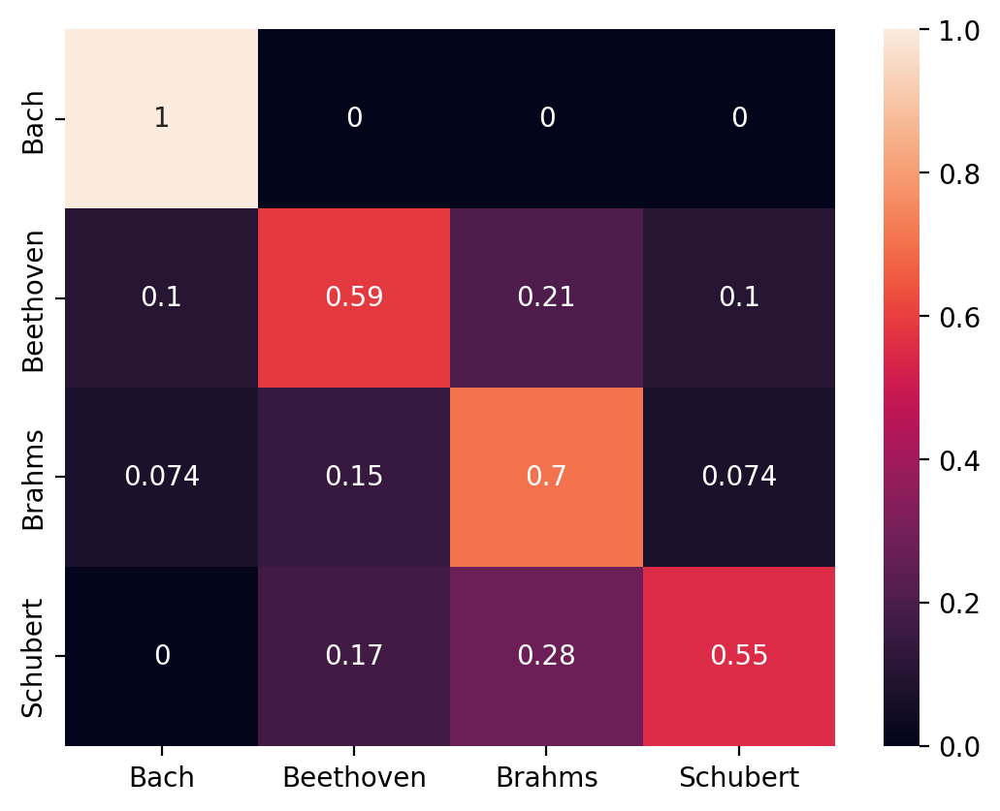

In [28]:
y_pred_test = my_Final_Model.predict(X_test)

from sklearn.metrics import confusion_matrix

import seaborn as sns

Composers = ['Bach','Beethoven','Brahms','Schubert']

c_matrix = pd.DataFrame(confusion_matrix(y_test,y_pred_test,normalize='true'))

c_matrix.index = Composers
c_matrix.columns = Composers

sns.heatmap(data=c_matrix,annot=True)

# Conclusions 

1. The model does excellent at classifying BACH 

2. The model is next best on Brahms

3. tunging C, gamma is critical for SVM with nonlinear RBF kernel

4. SVM improves with more data 

5. Brahms, Beethoven, and Schubert harder to distingusgh, and all the measures I tried very difficulty to see strong numerical signature of each one 

# Final intuition TEST 

* to better evaluate the model , would be good to have a good idea of ideal Human level performance and also ideal ML algorithm performance. This would tell us if significant model improvement is possible , say by investing in collecting much larger data set

In [38]:
import importlib
from pipeline_functions import *



Composers = ['Bach','Beethoven','Brahms','Schubert']

midi_files = make_composer_dict(Composers,data_dir = './')


# print number of files each folder

for composer in Composers:
    print(f'There are {len(midi_files[composer])} compositions by {composer}')


target_time = 30 # desired time in seconds for audio clips

n_clips = 1 # since clips range from 2 - 4 minutes, will get few different slices with some but not a lot of overlap

n_tracks = 3 # this will give 4*15 = 60 per composer , 240 in total

# keep track of extracted clips lists in a dictionary

composer_clips = dict()

#return list of clips for give composer 

# will go one at a time, could change to loop over list if were more than 4 composers to workwith 

for composer in Composers:
    composer_clips[composer] = extract_samples_composer(composer,midi_files,n_tracks=n_tracks,n_clips=n_clips)

There are 17 compositions by Bach
There are 132 compositions by Beethoven
There are 20 compositions by Brahms
There are 25 compositions by Schubert
./Bach/Cello Suite 3_BWV1009_2222_cs3-6gig.mid lasts approx  178.0581818181818  seconds
clip:  0  -->  t =  15.75 start =  46 stop = 66  delta =  20
./Bach/Violin Sonata in B minor_BWV1014_2284_vhs1_3.mid lasts approx  151.34728996720207  seconds
clip:  0  -->  t =  16.0 start =  13 stop = 20  delta =  7
./Bach/Violin Sonata No 1 in G minor_BWV1001_2243_vs1_3.mid lasts approx  186.63523499970867  seconds
clip:  0  -->  t =  54.0 start =  9 stop = 14  delta =  5
./Beethoven/String Quartet No 1 in F Major_OP18NO1_2403_qt01_4.mid lasts approx  315.7202498935679  seconds
clip:  0  -->  t =  15.148306488032517 start =  55 stop = 72  delta =  17
./Beethoven/Piano Sonata No 20 in C minor_OP111_2531_ps32_02.mid lasts approx  951.9290715488472  seconds
clip:  0  -->  t =  15.75 start =  31 stop = 44  delta =  13
./Beethoven/Piano Sonata No 8 in C mi

In [39]:
clip_indices = []

for composer in Composers: 
    
    for i in range(3):
        
        clip_indices.append((composer,i))
        
clip_indices = np.random.permutation(clip_indices) # shuffle the samples

In [40]:
guess_list = []

for composer,index in clip_indices: 
    
    index = int(index)
    
    clip_stream = composer_clips[composer][index].stream

    clip_stream.show('midi')
    
    print("Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert ")
    
    guess_list.append(Composers[int(input(f"Guess ??? :  "))])

Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  0


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  1


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  0


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  3


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  2


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  3


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  0


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  2


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  2


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  3


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  1


Listen and take a Guess... 0 - Bach , 1 Beethoven, 2 - Brahams, 3 - Schubert 
Guess ??? :  2


In [41]:
print('Guess: ',guess_list)
    
answers = [c for c,i in clip_indices]

print('Answers: ',answers)

Guess:  ['Bach', 'Beethoven', 'Bach', 'Schubert', 'Brahms', 'Schubert', 'Bach', 'Brahms', 'Brahms', 'Schubert', 'Beethoven', 'Brahms']
Answers:  ['Bach', 'Beethoven', 'Bach', 'Schubert', 'Schubert', 'Schubert', 'Bach', 'Beethoven', 'Brahms', 'Beethoven', 'Brahms', 'Brahms']


In [46]:
correct = sum([answers[i] == guess_list[i] for i in range(len(answers))])

acc = correct / len(guess_list)

print(correct, acc)

8 0.6666666666666666


# Got very lucky and didn't do too bad ! 

Suggests an expert would be able to do very well on this, and that significant improvement possible

future would focus on 

* more data for SVM 

* trying out CNN approach to see how it does, even on not too much data available 